In [1]:
!python -m venv virtualenv
!source virtualenv/bin/activate
!pip install torch==1.11.0+cu113 torchvision==0.12.0+cu113 torchaudio==0.11.0 torchtext==0.10.0 --extra-index-url https://download.pytorch.org/whl/cu113
# !pip install torchtext==0.10.0
!git clone https://github.com/openai/CLIP
!pip install taming-transformers
!git clone https://github.com/CompVis/taming-transformers.git
!pip install ftfy regex tqdm omegaconf pytorch-lightning
!pip install kornia
!pip install imageio-ffmpeg
!pip install einops
!mkdir steps
!pip install torchtext==0.6.0
!pip install pytorch-lightning==1.6.5

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu113
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 GB 948.5 kB/s eta 0:00:000:0100:04
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 67.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 77.4 MB/s eta 0:00:00:00:01
ERROR: Could not find a version that satisfies the requirement torchtext==0.10.0 (from versions: 0.1.1, 0.2.0, 0.2.1, 0.2.3, 0.3.1, 0.4.0, 0.5.0, 0.6.0, 0.12.0, 0.13.0, 0.13.1, 0.14.0, 0.14.1, 0.15.0+cpu, 0.15.1, 0.15.1+cpu, 0.15.2, 0.15.2+cpu, 0.16.0, 0.16.0+cpu, 0.16.1, 0.16.1+cpu, 0.16.2, 0.16.2+cpu, 0.17.0, 0.17.0+cpu, 0.17.1, 0.17.2, 0.18.0)
ERROR: No matching distribution found for torchtext==0.10.0
Cloning into 'CLIP'...
remote: Enumerating objects: 251, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 251 (delta 3), reused 2 (delta 0), pack-reused 243
Receiving objects: 100%

In [2]:
import os
import torch

from IPython.display import HTML
from base64 import b64encode
import argparse
import math
from pathlib import Path
import sys
sys.path.insert(1, './taming-transformers')

# from IPython import display
from base64 import b64encode
from omegaconf import OmegaConf
from PIL import Image
import matplotlib.pyplot as plt
from taming.models import cond_transformer, vqgan
import taming.models
import taming.modules 
from torch import nn, optim
from torch.nn import functional as F
from torchvision import transforms
from torchvision.transforms import functional as TF
from tqdm.notebook import tqdm
from CLIP import clip
import kornia.augmentation as K
import numpy as np
import imageio
from PIL import ImageFile, Image
from urllib.request import urlopen

ImageFile.LOAD_TRUNCATED_IMAGES = True
from pynvml.smi import nvmlInit, nvmlDeviceGetHandleByIndex, nvmlDeviceGetUtilizationRates
nvmlInit()
handle = nvmlDeviceGetHandleByIndex(0)

import warnings
warnings.filterwarnings("ignore")

device = "cuda" if torch.cuda.is_available() else "cpu"

2024-05-10 05:04:51.149767: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-10 05:04:51.149853: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-10 05:04:51.276557: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
torch.hub.download_url_to_file('https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fconfigs%2Fmodel.yaml&dl=1', 
                               'vqgan_imagenet_f16_16384.yaml')
torch.hub.download_url_to_file('https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fckpts%2Flast.ckpt&dl=1', 
                               'vqgan_imagenet_f16_16384.ckpt')

torch.hub.download_url_to_file('https://images.pexels.com/photos/158028/bellingrath-gardens-alabama-landscape-scenic-158028.jpeg', 
                               'garden.jpeg')
torch.hub.download_url_to_file('https://images.pexels.com/photos/803975/pexels-photo-803975.jpeg', 
                               'cabin.jpeg')

100%|██████████| 692/692 [00:00<00:00, 477kB/s]
100%|██████████| 935M/935M [02:23<00:00, 6.84MB/s]  
100%|██████████| 732k/732k [00:00<00:00, 52.9MB/s]
100%|██████████| 1.72M/1.72M [00:00<00:00, 2.15MB/s]


In [15]:
import torchvision.transforms.functional as TF
#Resample the input image

def resample(input , size , mode = 'bicubic'):
    #Convert input tensor to PIL Image
    input_pil = TF.to_pil_image(input)
    #Resize and resample 
    output_pil = TF.resize(input_pil , size , interpolation = mode)
    #Convert output PIL image back to tensor
    output_tensor = TF.to_tensor(output_pill)
    return output_tensor

In [5]:
class ReplaceGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x_forward, x_backward):
        ctx.shape = x_backward.shape
        return x_forward
    @staticmethod
    def backward(ctx, grad_in):
        return None, grad_in.sum_to_size(ctx.shape)
replace_grad = ReplaceGrad.apply

class ClampWithGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input, min, max):
        ctx.min = min
        ctx.max = max
        ctx.save_for_backward(input)
        return input.clamp(min, max)
    @staticmethod
    def backward(ctx, grad_in):
        input, = ctx.saved_tensors
        return grad_in * (grad_in * (input - input.clamp(ctx.min, ctx.max)) >= 0), None, None
clamp_with_grad = ClampWithGrad.apply

In [6]:
def vector_quantize(x, codebook):
    d = x.pow(2).sum(dim=-1, keepdim=True) + codebook.pow(2).sum(dim=1) - 2 * x @ codebook.T
    indices = d.argmin(-1)
    x_q = F.one_hot(indices, codebook.shape[0]).to(d.dtype) @ codebook
    return replace_grad(x_q, x)

class Prompt(nn.Module):
    def __init__(self, embed, weight=1., stop=float('-inf')):
        super().__init__()
        self.register_buffer('embed', embed)
        self.register_buffer('weight', torch.as_tensor(weight))
        self.register_buffer('stop', torch.as_tensor(stop))
    def forward(self, input):
        input_normed = F.normalize(input.unsqueeze(1), dim=2)
        embed_normed = F.normalize(self.embed.unsqueeze(0), dim=2)
        dists = input_normed.sub(embed_normed).norm(dim=2).div(2).arcsin().pow(2).mul(2)
        dists = dists * self.weight.sign()
        return self.weight.abs() * replace_grad(dists, torch.maximum(dists, self.stop)).mean()

def parse_prompt(prompt):
    vals = prompt.rsplit(':', 2)
    #Split a string into a list at colon 
    #Splitting occur 2 times at most
    vals = vals + ['', '1', '-inf'][len(vals):]
    #This line ensures that the vals list always has three elements. 
        #If the original string didn't have enough colons to produce three elements
        #If len(vals) is 3, it returns an empty list ('').
        #If len(vals) is 2, it returns 1 as the second element.
        #If len(vals) is 1, it returns -inf as the third element.
    return vals[0], float(vals[1]), float(vals[2])

In [7]:
#Data cutout augmentations
class MakeCutouts(nn.Module):
    def __init__(self, cut_size, cutn, cut_pow=1):
        super().__init__()
        self.cut_size = cut_size
        self.cutn = cutn
        self.cut_pow = cut_pow
        self.augs = nn.Sequential(
            K.RandomAffine(degrees=15, translate=0.1, p=0.7, padding_mode='border'),
            K.RandomPerspective(0.7,p=0.7),
            K.ColorJitter(hue=0.1, saturation=0.1, p=0.7),
            K.RandomErasing((.1, .4), (.3, 1/.3), same_on_batch=True, p=0.7),
        )
        self.noise_fac = 0.1
        self.av_pool = nn.AdaptiveAvgPool2d((self.cut_size, self.cut_size))
        self.max_pool = nn.AdaptiveMaxPool2d((self.cut_size, self.cut_size))

    def forward(self, input):
        slideY, slideX = input.shape[2:4]
        max_size = min(slideX, slideY)
        min_size = min(slideX, slideY, self.cut_size)
        cutouts = []

        for _ in range(self.cutn):
            cutout = (self.av_pool(input) + self.max_pool(input))/2
            cutouts.append(cutout)

        batch = self.augs(torch.cat(cutouts, dim=0))
        if self.noise_fac:
            facs = batch.new_empty([self.cutn, 1, 1, 1]).uniform_(0, self.noise_fac)
            batch = batch + facs * torch.randn_like(batch)
        return batch

In [8]:
def load_vqgan_model(config_path, checkpoint_path):
    config = OmegaConf.load(config_path)
    if config.model.target == 'taming.models.vqgan.VQModel':
        model = vqgan.VQModel(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)

    elif config.model.target == 'taming.models.vqgan.GumbelVQ':
        model = vqgan.GumbelVQ(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)

    elif config.model.target == 'taming.models.cond_transformer.Net2NetTransformer':
        parent_model = cond_transformer.Net2NetTransformer(**config.model.params)
        parent_model.eval().requires_grad_(False)
        parent_model.init_from_ckpt(checkpoint_path)
        model = parent_model.first_stage_model
    else:
        raise ValueError(f'unknown model type: {config.model.target}')
    del model.loss
    return model

In [9]:
def resize_image(image, out_size):
    ratio = image.size[0] / image.size[1]
    area = min(image.size[0] * image.size[1], out_size[0] * out_size[1])
    size = round((area * ratio)**0.5), round((area / ratio)**0.5)
    return image.resize(size, Image.LANCZOS)

In [10]:
model_name = "vqgan_imagenet_f16_16384" 
images_interval =  50
width =  512
height = 512
init_image = ""
seed = 42
BASE_PATH = '../input/flickr-image-dataset/flickr30k_images/flickr30k_images/'
args = argparse.Namespace(
    noise_prompt_seeds=[],
    noise_prompt_weights=[],
    size=[width, height],
    init_image=init_image,
    init_weight=0.,
    clip_model='ViT-B/32',
    vqgan_config=f'{model_name}.yaml',
    vqgan_checkpoint=f'{model_name}.ckpt',
    step_size=0.13,
    cutn=32,
    cut_pow=1.,
    display_freq=images_interval,
    seed=seed,
)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
model = load_vqgan_model(args.vqgan_config, args.vqgan_checkpoint).to(device)
perceptor = clip.load(args.clip_model, jit=False)[0].eval().requires_grad_(False).to(device)

Using device: cuda:0
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 170MB/s] 


8.19kB [00:00, 106kB/s]                    


loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from vqgan_imagenet_f16_16384.ckpt


100%|███████████████████████████████████████| 338M/338M [01:32<00:00, 3.85MiB/s]


In [11]:
def inference(text, 
              seed, 
              step_size,
              max_iterations,
              width, 
              height,
              init_image, 
              init_weight, 
              target_images, 
              cutn, 
              cut_pow,
              video_file
             ):
    all_frames = []
    size=[width, height]
    texts = text
    init_weight=init_weight

    if init_image:
        init_image = init_image
    else:
        init_image = ""
    if target_images:
        target_images = target_images
    else:
        target_images = ""
    max_iterations = max_iterations
    model_names={"vqgan_imagenet_f16_16384": 'ImageNet 16384',
                 "vqgan_imagenet_f16_1024":"ImageNet 1024", 
                 'vqgan_openimages_f16_8192':'OpenImages 8912',
                 "wikiart_1024":"WikiArt 1024", 
                 "wikiart_16384":"WikiArt 16384", 
                 "coco":"COCO-Stuff",
                 "faceshq":"FacesHQ",
                 "sflckr":"S-FLCKR"}
    name_model = model_names[model_name]
    if target_images == "None" or not target_images:
        target_images = []
    else:
        target_images = target_images.split("|")
        target_images = [image.strip() for image in target_images]

    texts = [phrase.strip() for phrase in texts.split("|")]
    if texts == ['']:
        texts = []
    if texts:
        print('Using texts:', texts)
    if target_images:
        print('Using image prompts:', target_images)
    if seed is None or seed == -1:
        seed = torch.seed()
    else:
        seed = seed
    torch.manual_seed(seed)
    print('Using seed:', seed)

    cut_size = perceptor.visual.input_resolution
    f = 2**(model.decoder.num_resolutions - 1)
    make_cutouts = MakeCutouts(cut_size, cutn, cut_pow=cut_pow)
    toksX, toksY = size[0] // f, size[1] // f
    sideX, sideY = toksX * f, toksY * f

    if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
        e_dim = 256
        n_toks = model.quantize.n_embed
        z_min = model.quantize.embed.weight.min(dim=0).values[None, :, None, None]
        z_max = model.quantize.embed.weight.max(dim=0).values[None, :, None, None]
    else:
        e_dim = model.quantize.e_dim
        n_toks = model.quantize.n_e
        z_min = model.quantize.embedding.weight.min(dim=0).values[None, :, None, None]
        z_max = model.quantize.embedding.weight.max(dim=0).values[None, :, None, None]

    if init_image:
        if 'http' in init_image:
            img = Image.open(urlopen(init_image))
        else:
            img = Image.open(init_image)
        pil_image = img.convert('RGB')
        pil_image = pil_image.resize((sideX, sideY), Image.LANCZOS)
        pil_tensor = TF.to_tensor(pil_image)
        z, *_ = model.encode(pil_tensor.to(device).unsqueeze(0) * 2 - 1)
    else:
        one_hot = F.one_hot(torch.randint(n_toks, [toksY * toksX], device=device), n_toks).float()
        # z = one_hot @ model.quantize.embedding.weight
        if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
            z = one_hot @ model.quantize.embed.weight
        else:
            z = one_hot @ model.quantize.embedding.weight
        z = z.view([-1, toksY, toksX, e_dim]).permute(0, 3, 1, 2) 
        z = torch.rand_like(z)*2
    z_orig = z.clone()
    z.requires_grad_(True)
    opt = optim.Adam([z], lr=step_size)
    normalize = transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                                    std=[0.26862954, 0.26130258, 0.27577711])
    pMs = []
    for prompt in texts:
        txt, weight, stop = parse_prompt(prompt)
        embed = perceptor.encode_text(clip.tokenize(txt).to(device)).float()
        pMs.append(Prompt(embed, weight, stop).to(device))
    for prompt in target_images:
        path, weight, stop = parse_prompt(prompt)
        img = Image.open(path)
        pil_image = img.convert('RGB')
        img = resize_image(pil_image, (sideX, sideY))
        batch = make_cutouts(TF.to_tensor(img).unsqueeze(0).to(device))
        embed = perceptor.encode_image(normalize(batch)).float()
        pMs.append(Prompt(embed, weight, stop).to(device))
    for seed, weight in zip(args.noise_prompt_seeds, args.noise_prompt_weights):
        gen = torch.Generator().manual_seed(seed)
        embed = torch.empty([1, perceptor.visual.output_dim]).normal_(generator=gen)
        pMs.append(Prompt(embed, weight).to(device))

    def synth(z):
        if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
            z_q = vector_quantize(z.movedim(1, 3), model.quantize.embed.weight).movedim(3, 1)
        else:
            z_q = vector_quantize(z.movedim(1, 3), model.quantize.embedding.weight).movedim(3, 1)
        return clamp_with_grad(model.decode(z_q).add(1).div(2), 0, 1)
    @torch.no_grad()
    def checkin(i, losses):
        losses_str = ', '.join(f'{loss.item():g}' for loss in losses)
        tqdm.write(f'i: {i}, loss: {sum(losses).item():g}, losses: {losses_str}')
        out = synth(z)
        # TF.to_pil_image(out[0].cpu()).save('progress.png')
        # display.display(display.Image('progress.png'))
        res = nvmlDeviceGetUtilizationRates(handle)
        print(f'gpu: {res.gpu}%, gpu-mem: {res.memory}%')
    def ascend_txt():
        # global i
        out = synth(z)
        iii = perceptor.encode_image(normalize(make_cutouts(out))).float()
        
        result = []
        if init_weight:
            result.append(F.mse_loss(z, z_orig) * init_weight / 2)
            #result.append(F.mse_loss(z, torch.zeros_like(z_orig)) * ((1/torch.tensor(i*2 + 1))*init_weight) / 2)
        for prompt in pMs:
            result.append(prompt(iii))
        img = np.array(out.mul(255).clamp(0, 255)[0].cpu().detach().numpy().astype(np.uint8))[:,:,:]
        img = np.transpose(img, (1, 2, 0))
        # imageio.imwrite('./steps/' + str(i) + '.png', np.array(img))
        img = Image.fromarray(img).convert('RGB')
        all_frames.append(img)
        return result, np.array(img)
    def train(i):
        opt.zero_grad()
        lossAll, image = ascend_txt()
        if i % args.display_freq == 0:
            checkin(i, lossAll)
        
        loss = sum(lossAll)
        loss.backward()
        opt.step()
        with torch.no_grad():
            z.copy_(z.maximum(z_min).minimum(z_max))
        return image
    i = 0
    try:
        with tqdm() as pbar:
            while True:
                image = train(i)
                if i == max_iterations:
                    break
                i += 1
                pbar.update()
    except KeyboardInterrupt:
        pass
    writer = imageio.get_writer(video_file + '.mp4', fps=20)
    for im in all_frames:
        writer.append_data(np.array(im))
    writer.close()
    # all_frames[0].save('out.gif',
              # save_all=True, append_images=all_frames[1:], optimize=False, duration=80, loop=0)
    return image

In [12]:
def load_image( infilename ) :
    img = Image.open( infilename )
    img.load()
    data = np.asarray( img, dtype="int32" )
    return data

In [13]:
def display_result(img) :
    plt.figure(figsize=(9,9))
    plt.imshow(img)
    plt.axis('off')

Using texts: ['a modern house in a forest']
Using seed: 27560


0it [00:00, ?it/s]

i: 0, loss: 0.968205, losses: 0.968205
gpu: 86%, gpu-mem: 32%
i: 50, loss: 0.901804, losses: 0.901804
gpu: 93%, gpu-mem: 33%
i: 100, loss: 0.845787, losses: 0.845787
gpu: 100%, gpu-mem: 44%
i: 150, loss: 0.780615, losses: 0.780615
gpu: 88%, gpu-mem: 31%
i: 200, loss: 0.725319, losses: 0.725319
gpu: 100%, gpu-mem: 38%
i: 250, loss: 0.758318, losses: 0.758318
gpu: 100%, gpu-mem: 41%
i: 300, loss: 0.730074, losses: 0.730074
gpu: 100%, gpu-mem: 43%
i: 350, loss: 0.755763, losses: 0.755763
gpu: 85%, gpu-mem: 31%
i: 400, loss: 0.787976, losses: 0.787976
gpu: 98%, gpu-mem: 44%
i: 450, loss: 0.778877, losses: 0.778877
gpu: 100%, gpu-mem: 38%
i: 500, loss: 0.730585, losses: 0.730585
gpu: 100%, gpu-mem: 38%
i: 550, loss: 0.717633, losses: 0.717633
gpu: 100%, gpu-mem: 41%
i: 600, loss: 0.716834, losses: 0.716834
gpu: 93%, gpu-mem: 33%
i: 650, loss: 0.663177, losses: 0.663177
gpu: 97%, gpu-mem: 36%
i: 700, loss: 0.728143, losses: 0.728143
gpu: 100%, gpu-mem: 39%


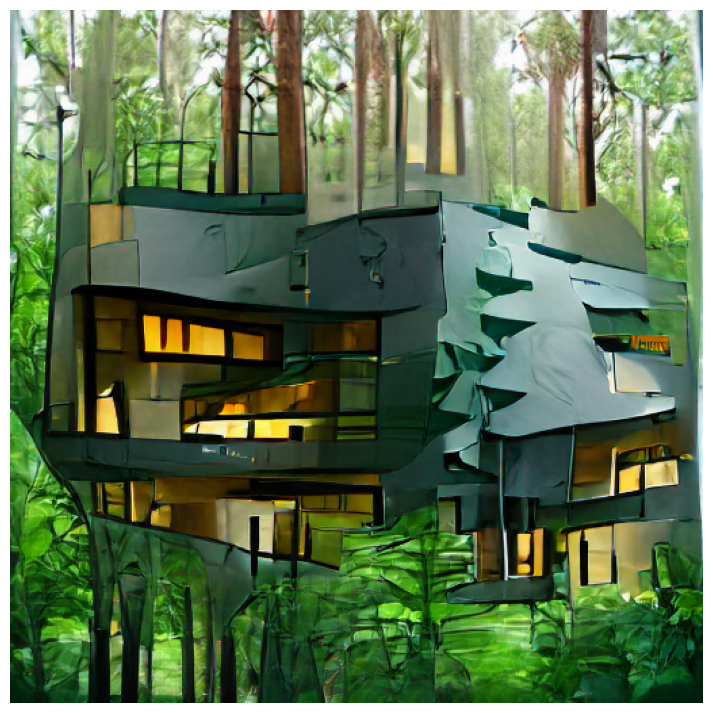

In [18]:
img = inference(
    text = 'a modern house in a forest', 
    seed = 27560,
    step_size = 0.14,
    max_iterations = 700,
    width = 512,
    height = 512,
    init_image = '',
    init_weight = 0.0,
    target_images = '', 
    cutn = 3,
    cut_pow = 1.0,
    video_file = "test2"
)
display_result(img)

In [19]:
mp4 = open('test2.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=500 loop="true" autoplay="autoplay" controls muted>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
img = inference(
    text = 'shanghai at night with neon lights',
    seed =  79472135470,
    step_size = 0.12,
    max_iterations = 300,
    width = 512,
    height = 512,
    init_image = '',
    init_weight = 0.024,
    target_images = '',
    cutn = 32,
    cut_pow = 1.0,
    video_file = "test3"
)
display_result(img)

In [ ]:
mp4 = open('test3.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=500 loop="true" autoplay="autoplay" controls muted>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)